In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
dataset=pd.read_csv("asthma_disease_data.csv")

In [3]:
dataset

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,PhysicalActivity,DietQuality,SleepQuality,...,LungFunctionFEV1,LungFunctionFVC,Wheezing,ShortnessOfBreath,ChestTightness,Coughing,NighttimeSymptoms,ExerciseInduced,Diagnosis,DoctorInCharge
0,5034,63,0,1,0,15.848744,0,0.894448,5.488696,8.701003,...,1.369051,4.941206,0,0,1,0,0,1,0,Dr_Confid
1,5035,26,1,2,2,22.757042,0,5.897329,6.341014,5.153966,...,2.197767,1.702393,1,0,0,1,1,1,0,Dr_Confid
2,5036,57,0,2,1,18.395396,0,6.739367,9.196237,6.840647,...,1.698011,5.022553,1,1,1,0,1,1,0,Dr_Confid
3,5037,40,1,2,1,38.515278,0,1.404503,5.826532,4.253036,...,3.032037,2.300159,1,0,1,1,1,0,0,Dr_Confid
4,5038,61,0,0,3,19.283802,0,4.604493,3.127048,9.625799,...,3.470589,3.067944,1,1,1,0,0,1,0,Dr_Confid
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2387,7421,43,1,0,2,29.059613,0,3.019854,6.119637,8.300960,...,3.125249,5.166032,0,1,0,0,0,1,1,Dr_Confid
2388,7422,18,1,0,1,20.740850,0,5.805180,4.386992,7.731192,...,1.132977,5.509502,0,0,0,1,1,0,1,Dr_Confid
2389,7423,54,0,3,2,37.079560,0,4.735169,8.214064,7.483521,...,1.685962,3.346877,1,0,1,1,0,1,1,Dr_Confid
2390,7424,46,1,0,2,23.444712,0,9.672637,7.362861,6.717272,...,3.481549,1.713274,0,1,1,0,1,1,0,Dr_Confid


In [4]:
# Drop columns using the drop() method
columns_to_drop=['PatientID','Ethnicity','EducationLevel','DoctorInCharge']
dataset=dataset.drop(columns=columns_to_drop)

In [5]:
dataset

,Age,Gender,BMI,Smoking,PhysicalActivity,DietQuality,SleepQuality,PollutionExposure,PollenExposure,DustExposure,...,GastroesophagealReflux,LungFunctionFEV1,LungFunctionFVC,Wheezing,ShortnessOfBreath,ChestTightness,Coughing,NighttimeSymptoms,ExerciseInduced,Diagnosis
0,63,0,15.848744,0,0.894448,5.488696,8.701003,7.388481,2.855578,0.974339,...,0,1.369051,4.941206,0,0,1,0,0,1,0
1,26,1,22.757042,0,5.897329,6.341014,5.153966,1.969838,7.457665,6.584631,...,0,2.197767,1.702393,1,0,0,1,1,1,0
2,57,0,18.395396,0,6.739367,9.196237,6.840647,1.460593,1.448189,5.445799,...,0,1.698011,5.022553,1,1,1,0,1,1,0
3,40,1,38.515278,0,1.404503,5.826532,4.253036,0.581905,7.571845,3.965316,...,0,3.032037,2.300159,1,0,1,1,1,0,0
4,61,0,19.283802,0,4.604493,3.127048,9.625799,0.980875,3.049807,8.260605,...,0,3.470589,3.067944,1,1,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2387,43,1,29.059613,0,3.019854,6.119637,8.300960,2.483829,7.314582,3.425445,...,0,3.125249,5.166032,0,1,0,0,0,1,1
2388,18,1,20.740850,0,5.805180,4.386992,7.731192,7.733983,2.279073,6.467701,...,0,1.132977,5.509502,0,0,0,1,1,0,1
2389,54,0,37.079560,0,4.735169,8.214064,7.483521,2.794847,3.055139,9.484013,...,0,1.685962,3.346877,1,0,1,1,0,1,1
2390,46,1,23.444712,0,9.672637,7.362861,6.717272,9.448862,7.712584,5.051405,...,1,3.481549,1.713274,0,1,1,0,1,1,0


In [6]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2392 entries, 0 to 2391
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     2392 non-null   int64  
 1   Gender                  2392 non-null   int64  
 2   BMI                     2392 non-null   float64
 3   Smoking                 2392 non-null   int64  
 4   PhysicalActivity        2392 non-null   float64
 5   DietQuality             2392 non-null   float64
 6   SleepQuality            2392 non-null   float64
 7   PollutionExposure       2392 non-null   float64
 8   PollenExposure          2392 non-null   float64
 9   DustExposure            2392 non-null   float64
 10  PetAllergy              2392 non-null   int64  
 11  FamilyHistoryAsthma     2392 non-null   int64  
 12  HistoryOfAllergies      2392 non-null   int64  
 13  Eczema                  2392 non-null   int64  
 14  HayFever                2392 non-null   

In [7]:
def quanQual(dataset):
    qual=[]
    quan=[]
    for columnName in dataset.columns:
        #print(columnName)
        if(dataset[columnName].dtypes=="O"):
            #print("qual")
            qual.append(columnName)
        else:
            #print("quan")
            quan.append(columnName)
    return quan,qual

In [8]:
quan,qual=quanQual(dataset)

In [9]:
quan

['Age',
 'Gender',
 'BMI',
 'Smoking',
 'PhysicalActivity',
 'DietQuality',
 'SleepQuality',
 'PollutionExposure',
 'PollenExposure',
 'DustExposure',
 'PetAllergy',
 'FamilyHistoryAsthma',
 'HistoryOfAllergies',
 'Eczema',
 'HayFever',
 'GastroesophagealReflux',
 'LungFunctionFEV1',
 'LungFunctionFVC',
 'Wheezing',
 'ShortnessOfBreath',
 'ChestTightness',
 'Coughing',
 'NighttimeSymptoms',
 'ExerciseInduced',
 'Diagnosis']

In [10]:
qual

[]

In [11]:
dataset.isnull().sum()

Age                       0
Gender                    0
BMI                       0
Smoking                   0
PhysicalActivity          0
DietQuality               0
SleepQuality              0
PollutionExposure         0
PollenExposure            0
DustExposure              0
PetAllergy                0
FamilyHistoryAsthma       0
HistoryOfAllergies        0
Eczema                    0
HayFever                  0
GastroesophagealReflux    0
LungFunctionFEV1          0
LungFunctionFVC           0
Wheezing                  0
ShortnessOfBreath         0
ChestTightness            0
Coughing                  0
NighttimeSymptoms         0
ExerciseInduced           0
Diagnosis                 0
dtype: int64

# Checking Outliers

In [12]:
descriptive=pd.DataFrame(index=["Mean","Median","Mode","Q1:25%","Q2:50%","Q3:75%","99%","Q4:100%","IQR","1.5rule","Lesser",
                                    "Greater","Min","Max"],columns=quan)
for columnName in quan:
        descriptive[columnName]["Mean"]=dataset[columnName].mean()
        descriptive[columnName]["Median"]=dataset[columnName].median()
        descriptive[columnName]["Mode"]=dataset[columnName].mode()[0]
        descriptive[columnName]["Q1:25%"]=dataset.describe()[columnName]["25%"]
        descriptive[columnName]["Q2:50%"]=dataset.describe()[columnName]["50%"]
        descriptive[columnName]["Q3:75%"]=dataset.describe()[columnName]["75%"]
        descriptive[columnName]["99%"]=np.percentile(dataset[columnName],99)
        descriptive[columnName]["Q4:100%"]=dataset.describe()[columnName]["max"]
        descriptive[columnName]["IQR"]=descriptive[columnName]["Q3:75%"]-descriptive[columnName]["Q1:25%"]
        descriptive[columnName]["1.5rule"]=1.5*descriptive[columnName]["IQR"]
        descriptive[columnName]["Lesser"]=descriptive[columnName]["Q1:25%"]-descriptive[columnName]["1.5rule"]
        descriptive[columnName]["Greater"]=descriptive[columnName]["Q3:75%"]+descriptive[columnName]["1.5rule"]
        descriptive[columnName]["Min"]=dataset[columnName].min()
        descriptive[columnName]["Max"]=dataset[columnName].max()

In [13]:
descriptive

,Age,Gender,BMI,Smoking,PhysicalActivity,DietQuality,SleepQuality,PollutionExposure,PollenExposure,DustExposure,...,GastroesophagealReflux,LungFunctionFEV1,LungFunctionFVC,Wheezing,ShortnessOfBreath,ChestTightness,Coughing,NighttimeSymptoms,ExerciseInduced,Diagnosis
Mean,42.13796,0.493311,27.244877,0.141722,5.051786,5.022867,7.019012,5.01303,5.114221,4.981864,...,0.158027,2.548564,3.74127,0.596154,0.500418,0.503344,0.503344,0.602425,0.604933,0.051839
Median,42.0,0.0,27.052202,0.0,5.016881,5.115383,6.975839,5.036519,5.098452,4.903278,...,0.0,2.553244,3.734982,1.0,1.0,1.0,1.0,1.0,1.0,0.0
Mode,51,0,15.031803,0,0.00174,0.003031,4.001437,0.001022,0.000659,0.002434,...,0,1.000459,1.500045,1,1,1,1,1,1,0
Q1:25%,23.0,0.0,20.968313,0.0,2.578333,2.432043,5.4985,2.432559,2.599996,2.467489,...,0.0,1.824113,2.607489,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Q2:50%,42.0,0.0,27.052202,0.0,5.016881,5.115383,6.975839,5.036519,5.098452,4.903278,...,0.0,2.553244,3.734982,1.0,1.0,1.0,1.0,1.0,1.0,0.0
Q3:75%,61.0,1.0,33.555903,0.0,7.540234,7.544216,8.52695,7.630037,7.708836,7.432218,...,0.0,3.292897,4.864121,1.0,1.0,1.0,1.0,1.0,1.0,0.0
99%,79.0,1.0,39.583299,1.0,9.905706,9.907609,9.929662,9.913024,9.897564,9.901374,...,1.0,3.97928,5.950777,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Q4:100%,79.0,1.0,39.985611,1.0,9.995809,9.999904,9.996235,9.998964,9.999555,9.999708,...,1.0,3.999719,5.999421,1.0,1.0,1.0,1.0,1.0,1.0,1.0
IQR,38.0,1.0,12.58759,0.0,4.9619,5.112172,3.02845,5.197479,5.10884,4.964729,...,0.0,1.468784,2.256632,1.0,1.0,1.0,1.0,1.0,1.0,0.0
1.5rule,57.0,1.5,18.881385,0.0,7.442851,7.668258,4.542674,7.796218,7.66326,7.447094,...,0.0,2.203175,3.384948,1.5,1.5,1.5,1.5,1.5,1.5,0.0


In [14]:
lesser=[]
greater=[]
for columnName in quan:
    if(descriptive[columnName]["Min"]<descriptive[columnName]["Lesser"]):
        lesser.append(columnName)
    if(descriptive[columnName]["Max"]>descriptive[columnName]["Greater"]):
        greater.append(columnName)    

In [15]:
descriptive

,Age,Gender,BMI,Smoking,PhysicalActivity,DietQuality,SleepQuality,PollutionExposure,PollenExposure,DustExposure,...,GastroesophagealReflux,LungFunctionFEV1,LungFunctionFVC,Wheezing,ShortnessOfBreath,ChestTightness,Coughing,NighttimeSymptoms,ExerciseInduced,Diagnosis
Mean,42.13796,0.493311,27.244877,0.141722,5.051786,5.022867,7.019012,5.01303,5.114221,4.981864,...,0.158027,2.548564,3.74127,0.596154,0.500418,0.503344,0.503344,0.602425,0.604933,0.051839
Median,42.0,0.0,27.052202,0.0,5.016881,5.115383,6.975839,5.036519,5.098452,4.903278,...,0.0,2.553244,3.734982,1.0,1.0,1.0,1.0,1.0,1.0,0.0
Mode,51,0,15.031803,0,0.00174,0.003031,4.001437,0.001022,0.000659,0.002434,...,0,1.000459,1.500045,1,1,1,1,1,1,0
Q1:25%,23.0,0.0,20.968313,0.0,2.578333,2.432043,5.4985,2.432559,2.599996,2.467489,...,0.0,1.824113,2.607489,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Q2:50%,42.0,0.0,27.052202,0.0,5.016881,5.115383,6.975839,5.036519,5.098452,4.903278,...,0.0,2.553244,3.734982,1.0,1.0,1.0,1.0,1.0,1.0,0.0
Q3:75%,61.0,1.0,33.555903,0.0,7.540234,7.544216,8.52695,7.630037,7.708836,7.432218,...,0.0,3.292897,4.864121,1.0,1.0,1.0,1.0,1.0,1.0,0.0
99%,79.0,1.0,39.583299,1.0,9.905706,9.907609,9.929662,9.913024,9.897564,9.901374,...,1.0,3.97928,5.950777,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Q4:100%,79.0,1.0,39.985611,1.0,9.995809,9.999904,9.996235,9.998964,9.999555,9.999708,...,1.0,3.999719,5.999421,1.0,1.0,1.0,1.0,1.0,1.0,1.0
IQR,38.0,1.0,12.58759,0.0,4.9619,5.112172,3.02845,5.197479,5.10884,4.964729,...,0.0,1.468784,2.256632,1.0,1.0,1.0,1.0,1.0,1.0,0.0
1.5rule,57.0,1.5,18.881385,0.0,7.442851,7.668258,4.542674,7.796218,7.66326,7.447094,...,0.0,2.203175,3.384948,1.5,1.5,1.5,1.5,1.5,1.5,0.0


In [16]:
lesser

[]

In [17]:
greater

['Smoking', 'PetAllergy', 'Eczema', 'GastroesophagealReflux', 'Diagnosis']

# Frequency

In [18]:
dataset["Age"].value_counts()

51    47
12    45
27    43
57    42
22    40
      ..
52    24
68    23
30    23
55    22
9     21
Name: Age, Length: 75, dtype: int64

In [19]:
freqTable=pd.DataFrame(columns=["Unique_Values","Frequency","Relative_Frequency","Cumsum"])

In [20]:
freqTable

,Unique_Values,Frequency,Relative_Frequency,Cumsum


In [21]:
freqTable["Unique_Values"]=dataset["Age"].value_counts().index
freqTable["Frequency"]=dataset["Age"].value_counts().values
freqTable["Relative_Frequency"]=(freqTable["Frequency"]/75)
freqTable["Cumsum"]=freqTable["Relative_Frequency"].cumsum()

In [22]:
freqTable

,Unique_Values,Frequency,Relative_Frequency,Cumsum
0,51,47,0.626667,0.626667
1,12,45,0.600000,1.226667
2,27,43,0.573333,1.800000
3,57,42,0.560000,2.360000
4,22,40,0.533333,2.893333
...,...,...,...,...
70,52,24,0.320000,30.706667
71,68,23,0.306667,31.013333
72,30,23,0.306667,31.320000
73,55,22,0.293333,31.613333


# Skewness & Kurtosis

In [23]:
descriptive=pd.DataFrame(index=["Mean","Median","Mode","Q1:25%","Q2:50%","Q3:75%","99%","Q4:100%","IQR","1.5rule","Lesser",
                                    "Greater","Min","Max","Skewness","Kurtosis"],columns=quan)
for columnName in quan:
    descriptive[columnName]["Mean"]=dataset[columnName].mean()
    descriptive[columnName]["Median"]=dataset[columnName].median()
    descriptive[columnName]["Mode"]=dataset[columnName].mode()[0]
    descriptive[columnName]["Q1:25%"]=dataset.describe()[columnName]["25%"]
    descriptive[columnName]["Q2:50%"]=dataset.describe()[columnName]["50%"]
    descriptive[columnName]["Q3:75%"]=dataset.describe()[columnName]["75%"]
    descriptive[columnName]["99%"]=np.percentile(dataset[columnName],99)
    descriptive[columnName]["Q4:100%"]=dataset.describe()[columnName]["max"]
    descriptive[columnName]["IQR"]=descriptive[columnName]["Q3:75%"]-descriptive[columnName]["Q1:25%"]
    descriptive[columnName]["1.5rule"]=1.5*descriptive[columnName]["IQR"]
    descriptive[columnName]["Lesser"]=descriptive[columnName]["Q1:25%"]-descriptive[columnName]["1.5rule"]
    descriptive[columnName]["Greater"]=descriptive[columnName]["Q3:75%"]+descriptive[columnName]["1.5rule"]
    descriptive[columnName]["Min"]=dataset[columnName].min()
    descriptive[columnName]["Max"]=dataset[columnName].max()
    descriptive[columnName]["Skewness"]=dataset[columnName].skew()
    descriptive[columnName]["Kurtosis"]=dataset[columnName].kurtosis()

In [24]:
descriptive

,Age,Gender,BMI,Smoking,PhysicalActivity,DietQuality,SleepQuality,PollutionExposure,PollenExposure,DustExposure,...,GastroesophagealReflux,LungFunctionFEV1,LungFunctionFVC,Wheezing,ShortnessOfBreath,ChestTightness,Coughing,NighttimeSymptoms,ExerciseInduced,Diagnosis
Mean,42.13796,0.493311,27.244877,0.141722,5.051786,5.022867,7.019012,5.01303,5.114221,4.981864,...,0.158027,2.548564,3.74127,0.596154,0.500418,0.503344,0.503344,0.602425,0.604933,0.051839
Median,42.0,0.0,27.052202,0.0,5.016881,5.115383,6.975839,5.036519,5.098452,4.903278,...,0.0,2.553244,3.734982,1.0,1.0,1.0,1.0,1.0,1.0,0.0
Mode,51,0,15.031803,0,0.00174,0.003031,4.001437,0.001022,0.000659,0.002434,...,0,1.000459,1.500045,1,1,1,1,1,1,0
Q1:25%,23.0,0.0,20.968313,0.0,2.578333,2.432043,5.4985,2.432559,2.599996,2.467489,...,0.0,1.824113,2.607489,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Q2:50%,42.0,0.0,27.052202,0.0,5.016881,5.115383,6.975839,5.036519,5.098452,4.903278,...,0.0,2.553244,3.734982,1.0,1.0,1.0,1.0,1.0,1.0,0.0
Q3:75%,61.0,1.0,33.555903,0.0,7.540234,7.544216,8.52695,7.630037,7.708836,7.432218,...,0.0,3.292897,4.864121,1.0,1.0,1.0,1.0,1.0,1.0,0.0
99%,79.0,1.0,39.583299,1.0,9.905706,9.907609,9.929662,9.913024,9.897564,9.901374,...,1.0,3.97928,5.950777,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Q4:100%,79.0,1.0,39.985611,1.0,9.995809,9.999904,9.996235,9.998964,9.999555,9.999708,...,1.0,3.999719,5.999421,1.0,1.0,1.0,1.0,1.0,1.0,1.0
IQR,38.0,1.0,12.58759,0.0,4.9619,5.112172,3.02845,5.197479,5.10884,4.964729,...,0.0,1.468784,2.256632,1.0,1.0,1.0,1.0,1.0,1.0,0.0
1.5rule,57.0,1.5,18.881385,0.0,7.442851,7.668258,4.542674,7.796218,7.66326,7.447094,...,0.0,2.203175,3.384948,1.5,1.5,1.5,1.5,1.5,1.5,0.0


# Variance and Standard deviation

In [25]:
descriptive=pd.DataFrame(index=["Mean","Median","Mode","Q1:25%","Q2:50%","Q3:75%","99%","Q4:100%","IQR","1.5rule","Lesser",
                                    "Greater","Min","Max","Skewness","Kurtosis","Variance","Std"],columns=quan)
for columnName in quan:
    descriptive[columnName]["Mean"]=dataset[columnName].mean()
    descriptive[columnName]["Median"]=dataset[columnName].median()
    descriptive[columnName]["Mode"]=dataset[columnName].mode()[0]
    descriptive[columnName]["Q1:25%"]=dataset.describe()[columnName]["25%"]
    descriptive[columnName]["Q2:50%"]=dataset.describe()[columnName]["50%"]
    descriptive[columnName]["Q3:75%"]=dataset.describe()[columnName]["75%"]
    descriptive[columnName]["99%"]=np.percentile(dataset[columnName],99)
    descriptive[columnName]["Q4:100%"]=dataset.describe()[columnName]["max"]
    descriptive[columnName]["IQR"]=descriptive[columnName]["Q3:75%"]-descriptive[columnName]["Q1:25%"]
    descriptive[columnName]["1.5rule"]=1.5*descriptive[columnName]["IQR"]
    descriptive[columnName]["Lesser"]=descriptive[columnName]["Q1:25%"]-descriptive[columnName]["1.5rule"]
    descriptive[columnName]["Greater"]=descriptive[columnName]["Q3:75%"]+descriptive[columnName]["1.5rule"]
    descriptive[columnName]["Min"]=dataset[columnName].min()
    descriptive[columnName]["Max"]=dataset[columnName].max()
    descriptive[columnName]["Skewness"]=dataset[columnName].skew()
    descriptive[columnName]["Kurtosis"]=dataset[columnName].kurtosis()
    descriptive[columnName]["Variance"]=dataset[columnName].var()
    descriptive[columnName]["Std"]=dataset[columnName].std()        

In [26]:
descriptive

,Age,Gender,BMI,Smoking,PhysicalActivity,DietQuality,SleepQuality,PollutionExposure,PollenExposure,DustExposure,...,GastroesophagealReflux,LungFunctionFEV1,LungFunctionFVC,Wheezing,ShortnessOfBreath,ChestTightness,Coughing,NighttimeSymptoms,ExerciseInduced,Diagnosis
Mean,42.13796,0.493311,27.244877,0.141722,5.051786,5.022867,7.019012,5.01303,5.114221,4.981864,...,0.158027,2.548564,3.74127,0.596154,0.500418,0.503344,0.503344,0.602425,0.604933,0.051839
Median,42.0,0.0,27.052202,0.0,5.016881,5.115383,6.975839,5.036519,5.098452,4.903278,...,0.0,2.553244,3.734982,1.0,1.0,1.0,1.0,1.0,1.0,0.0
Mode,51,0,15.031803,0,0.00174,0.003031,4.001437,0.001022,0.000659,0.002434,...,0,1.000459,1.500045,1,1,1,1,1,1,0
Q1:25%,23.0,0.0,20.968313,0.0,2.578333,2.432043,5.4985,2.432559,2.599996,2.467489,...,0.0,1.824113,2.607489,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Q2:50%,42.0,0.0,27.052202,0.0,5.016881,5.115383,6.975839,5.036519,5.098452,4.903278,...,0.0,2.553244,3.734982,1.0,1.0,1.0,1.0,1.0,1.0,0.0
Q3:75%,61.0,1.0,33.555903,0.0,7.540234,7.544216,8.52695,7.630037,7.708836,7.432218,...,0.0,3.292897,4.864121,1.0,1.0,1.0,1.0,1.0,1.0,0.0
99%,79.0,1.0,39.583299,1.0,9.905706,9.907609,9.929662,9.913024,9.897564,9.901374,...,1.0,3.97928,5.950777,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Q4:100%,79.0,1.0,39.985611,1.0,9.995809,9.999904,9.996235,9.998964,9.999555,9.999708,...,1.0,3.999719,5.999421,1.0,1.0,1.0,1.0,1.0,1.0,1.0
IQR,38.0,1.0,12.58759,0.0,4.9619,5.112172,3.02845,5.197479,5.10884,4.964729,...,0.0,1.468784,2.256632,1.0,1.0,1.0,1.0,1.0,1.0,0.0
1.5rule,57.0,1.5,18.881385,0.0,7.442851,7.668258,4.542674,7.796218,7.66326,7.447094,...,0.0,2.203175,3.384948,1.5,1.5,1.5,1.5,1.5,1.5,0.0


# Normal Distribution(PDF & CDF)

In [27]:
def get_pdf_probability(dataset,startrange,endrange):
    from matplotlib import pyplot
    from scipy.stats import norm
    import seaborn as sns
    ax=sns.distplot(dataset,kde=True,kde_kws={'color':'blue'},color='Green')
    pyplot.axvline(startrange,color='red')
    pyplot.axvline(endrange,color='red')
    #generate a sample
    sample=dataset
    #calculate parameters
    sample_mean=sample.mean()
    sample_std=sample.std()
    print('Mean=%.3f,Standard Deviation=%.3f'%(sample_mean,sample_std))
    #define the distribution
    dist=norm(sample_mean,sample_std)
    #sample probability for a range of outcomes
    values=[value for value in range(startrange,endrange)]
    probabilities=[dist.pdf(value) for value in values]
    prob=sum(probabilities)
    print("The area between range({},{}:{}".format(startrange,endrange,sum(probabilities)))
    return prob    

Mean=27.245,Standard Deviation=7.202
The area between range(40,60:0.044272438297460776


C:\Anaconda\envs\ai\lib\site-packages\ipykernel_launcher.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  """
C:\Anaconda\envs\ai\lib\site-packages\matplotlib\cbook\__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
C:\Anaconda\envs\ai\lib\site-packages\matplotlib\axes\_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
C:\Anac

0.044272438297460776

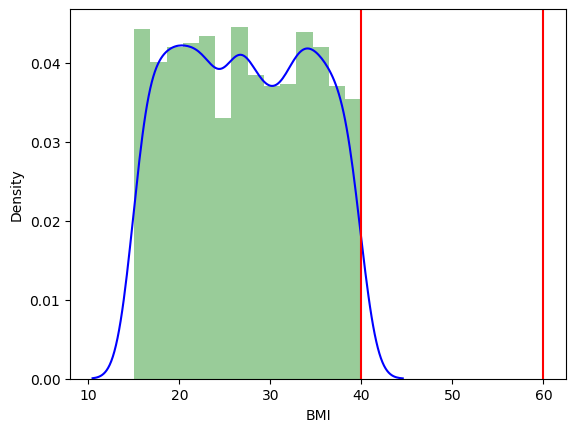

In [28]:
get_pdf_probability(dataset["BMI"],40,60)

In [29]:
from statsmodels.distributions.empirical_distribution import ECDF
ecdf=ECDF(dataset['BMI'])
ecdf(90)

1.0

# convert normal distribution to std normal distribution

In [30]:
def stdNdist(dataset):
    #to convert std normal distribution
    import seaborn as sns
    mean=dataset.mean()
    std=dataset.std()
    values=[i for i in dataset]
    z_score=[((j-mean)/std)for j in values]
    sns.distplot(z_score,kde=True)
    sum(z_score)/len(z_score)
    #z_score.std()

C:\Anaconda\envs\ai\lib\site-packages\ipykernel_launcher.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  
C:\Anaconda\envs\ai\lib\site-packages\matplotlib\cbook\__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
C:\Anaconda\envs\ai\lib\site-packages\matplotlib\axes\_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
C:\Anacond

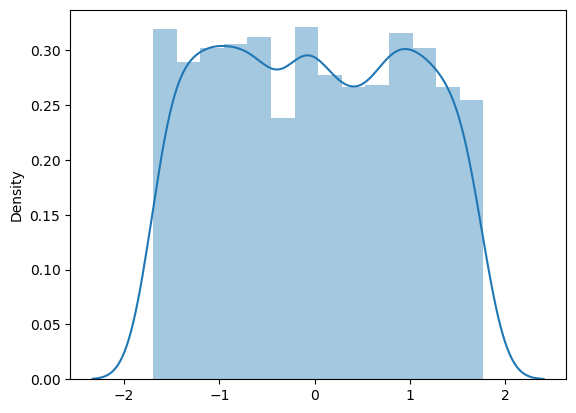

In [31]:
stdNdist(dataset['BMI'])

C:\Anaconda\envs\ai\lib\site-packages\ipykernel_launcher.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  
C:\Anaconda\envs\ai\lib\site-packages\matplotlib\cbook\__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
C:\Anaconda\envs\ai\lib\site-packages\matplotlib\axes\_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
C:\Anacond

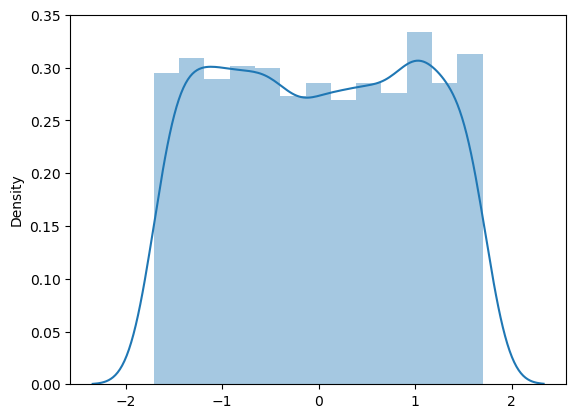

In [32]:
stdNdist(dataset['PollutionExposure'])

# Q1)Difference between the overall columns

In [33]:
dataset.cov()

,Age,Gender,BMI,Smoking,PhysicalActivity,DietQuality,SleepQuality,PollutionExposure,PollenExposure,DustExposure,...,GastroesophagealReflux,LungFunctionFEV1,LungFunctionFVC,Wheezing,ShortnessOfBreath,ChestTightness,Coughing,NighttimeSymptoms,ExerciseInduced,Diagnosis
Age,466.847542,-0.034627,2.518205,-0.070167,0.003342,0.267986,0.101737,-2.683714,-0.422135,0.855487,...,0.153848,-0.140315,0.270249,0.083760,0.265103,-0.066961,0.312796,-0.278879,0.169123,-0.072399
Gender,-0.034627,0.250060,0.085910,-0.002188,0.031596,-0.022373,-0.020309,0.001092,-0.047579,-0.034771,...,-0.000615,0.005707,-0.018040,-0.003121,0.005231,0.000022,-0.002069,-0.001197,0.007185,0.000347
BMI,2.518205,0.085910,51.863444,0.012285,-0.251885,-0.314267,-0.160836,-0.612286,-0.265558,1.335122,...,0.027546,-0.064276,0.031525,0.161609,0.054514,-0.035684,-0.014378,-0.005123,0.042070,-0.019997
Smoking,-0.070167,-0.002188,0.012285,0.121688,0.014017,-0.027418,-0.007463,0.011304,-0.002257,-0.010147,...,0.004362,0.004683,0.007478,-0.000877,-0.010306,-0.001938,-0.002356,0.002417,-0.000448,-0.001495
PhysicalActivity,0.003342,0.031596,-0.251885,0.014017,8.430744,0.418135,0.036258,-0.251786,0.054631,-0.097477,...,-0.037167,0.039410,-0.112467,0.019605,-0.035596,-0.041945,0.000973,-0.012997,-0.006205,0.003262
DietQuality,0.267986,-0.022373,-0.314267,-0.027418,0.418135,8.467985,0.072369,0.059417,0.147768,-0.232175,...,0.022209,-0.018345,-0.008212,0.056374,0.051868,0.018444,-0.019622,0.031804,-0.034280,-0.002032
SleepQuality,0.101737,-0.020309,-0.160836,-0.007463,0.036258,0.072369,3.001468,-0.149391,-0.202641,-0.156253,...,-0.022411,-0.005430,0.001825,0.008993,-0.009846,-0.005697,0.013248,-0.004389,-0.022080,0.006924
PollutionExposure,-2.683714,0.001092,-0.612286,0.011304,-0.251786,0.059417,-0.149391,8.617775,0.099014,-0.069077,...,0.006641,-0.061572,0.105692,-0.010625,0.028075,0.039999,0.008328,0.021485,-0.013597,-0.002952
PollenExposure,-0.422135,-0.047579,-0.265558,-0.002257,0.054631,0.147768,-0.202641,0.099014,8.369959,-0.019343,...,-0.004970,-0.031467,0.042130,0.014837,0.034413,0.047953,0.039649,-0.033482,-0.008440,0.009686
DustExposure,0.855487,-0.034771,1.335122,-0.010147,-0.097477,-0.232175,-0.156253,-0.069077,-0.019343,8.174979,...,-0.017610,-0.008899,0.071751,0.014057,0.024516,0.024774,-0.018145,0.070127,0.021727,-0.016467


# Q2)Relationship between the asthma disease with affecting parameter.

In [34]:
dataset.corr()

,Age,Gender,BMI,Smoking,PhysicalActivity,DietQuality,SleepQuality,PollutionExposure,PollenExposure,DustExposure,...,GastroesophagealReflux,LungFunctionFEV1,LungFunctionFVC,Wheezing,ShortnessOfBreath,ChestTightness,Coughing,NighttimeSymptoms,ExerciseInduced,Diagnosis
Age,1.000000,-0.003205,0.016184,-0.009309,0.000053,0.004262,0.002718,-0.042311,-0.006753,0.013848,...,0.019516,-0.007535,0.009594,0.007899,0.024534,-0.006197,0.028948,-0.026368,0.016008,-0.015111
Gender,-0.003205,1.000000,0.023856,-0.012545,0.021761,-0.015375,-0.023442,0.000744,-0.032887,-0.024320,...,-0.003373,0.013243,-0.027673,-0.012716,0.020916,0.000089,-0.008273,-0.004889,0.029384,0.003128
BMI,0.016184,0.023856,1.000000,0.004890,-0.012046,-0.014996,-0.012891,-0.028962,-0.012746,0.064841,...,0.010484,-0.010356,0.003358,0.045725,0.015136,-0.009908,-0.003992,-0.001453,0.011947,-0.012522
Smoking,-0.009309,-0.012545,0.004890,1.000000,0.013838,-0.027010,-0.012348,0.011038,-0.002237,-0.010173,...,0.034271,0.015578,0.016444,-0.005121,-0.059075,-0.011109,-0.013507,0.014152,-0.002629,-0.019321
PhysicalActivity,0.000053,0.021761,-0.012046,0.013838,1.000000,0.049487,0.007208,-0.029539,0.006504,-0.011742,...,-0.035085,0.015749,-0.029711,0.013758,-0.024513,-0.028887,0.000670,-0.009144,-0.004371,0.005066
DietQuality,0.004262,-0.015375,-0.014996,-0.027010,0.049487,1.000000,0.014355,0.006955,0.017552,-0.027905,...,0.020919,-0.007315,-0.002165,0.039474,0.035641,0.012674,-0.013483,0.022328,-0.024092,-0.003149
SleepQuality,0.002718,-0.023442,-0.012891,-0.012348,0.007208,0.014355,1.000000,-0.029374,-0.040430,-0.031544,...,-0.035456,-0.003637,0.000808,0.010577,-0.011363,-0.006576,0.015291,-0.005175,-0.026065,0.018022
PollutionExposure,-0.042311,0.000744,-0.028962,0.011038,-0.029539,0.006955,-0.029374,1.000000,0.011658,-0.008230,...,0.006201,-0.024337,0.027617,-0.007375,0.019123,0.027246,0.005673,0.014951,-0.009472,-0.004535
PollenExposure,-0.006753,-0.032887,-0.012746,-0.002237,0.006504,0.017552,-0.040430,0.011658,1.000000,-0.002338,...,-0.004708,-0.012621,0.011170,0.010449,0.023785,0.033144,0.027404,-0.023643,-0.005966,0.015099
DustExposure,0.013848,-0.024320,0.064841,-0.010173,-0.011742,-0.027905,-0.031544,-0.008230,-0.002338,1.000000,...,-0.016882,-0.003611,0.019249,0.010018,0.017145,0.017326,-0.012690,0.050106,0.015541,-0.025972


In [35]:
#Electric Range and Eligibility Having good correlation - -0.687
#Electric Range and Electric utility Having not good correlation - -0.016
#Based on model and Electric Range having not good correlation - -0.094

 # Q3Find the Variance between parameter affects more(VIF)

In [36]:
import seaborn as sns

In [37]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(x):
    #calculating vif
    vif=pd.DataFrame()
    vif["Variables"]=x.columns
    vif["VIF"]=[variance_inflation_factor(x.values,i)for i in range(x.shape[1])]
    return vif

In [38]:
calc_vif(dataset[["PollutionExposure","LungFunctionFEV1","Coughing"]])

,Variables,VIF
0,PollutionExposure,3.030004
1,LungFunctionFEV1,3.452677
2,Coughing,1.874695


# Q4) How many patients are with Cough in Agewise?

In [39]:
import plotly.express as px

fig = px.histogram(dataset, x='Coughing',color='Age',title='Num of patients with cough', 
                   labels={'COUGHING': 'Coughing'})
fig.show()

#Model 81 and 84 model is in peak

# Q5)What are the percentage of patients affected and not affected by wheezing?

In [40]:
Diagnosis_df=dataset['Wheezing'].value_counts().reset_index()
Diagnosis_df.rename(columns={'index':'Wheezing','Wheezing':'COUNT OF WHEEZING'},inplace=True)
Diagnosis_df

,Wheezing,COUNT OF WHEEZING
0,1,1426
1,0,966


In [41]:
fig = px.pie(dataset,names='Wheezing',values='Age',color='Wheezing',             
             title='Percentage of patients affected and not affected by wheezing based on age').update_traces(textposition='inside'
                                                                                                              ,textinfo='percent+label')
fig.show()

#0 represents the percentage of eligibility - 36.8%
#1 represents the percentage of eligibility Unknown battery range - 52.2%
#2 represents the percentage of Not Eligible - 11%

# Q6) What is the diagnosis of positive and its count?

In [42]:
# Count patients with Diagnosis == 1
count_diagnosis_positive = dataset[dataset['Diagnosis'] == 1].shape[0]

# Print the counts
print("Number of patients with Diagnosis == 1:", count_diagnosis_positive)

Number of patients with Diagnosis == 1: 124


# Q7) What is the diagnosis of negative and its count?

In [43]:
# Count patients with Diagnosis == 0
count_diagnosis_negative = dataset[dataset['Diagnosis'] == 0].shape[0]
# Print the counts
print("Number of patients with Diagnosis == 0:", count_diagnosis_negative)

Number of patients with Diagnosis == 0: 2268


# Q8)What is the range of BMI across the Diet quality?

C:\Anaconda\envs\ai\lib\site-packages\matplotlib\cbook\__init__.py:1402: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.

C:\Anaconda\envs\ai\lib\site-packages\matplotlib\axes\_base.py:276: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.

C:\Anaconda\envs\ai\lib\site-packages\matplotlib\axes\_base.py:278: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.



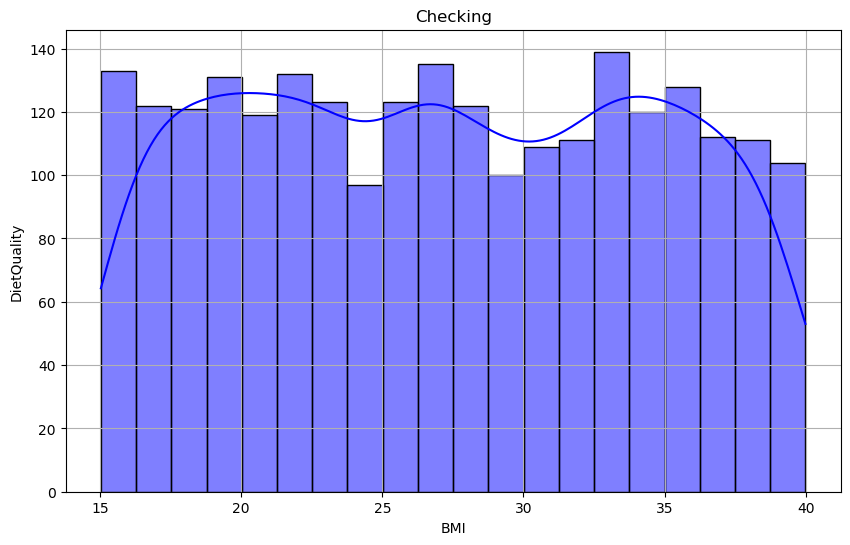

In [44]:
plt.figure(figsize=(10, 6))
sns.histplot(dataset['BMI'], bins=20, kde=True, color='blue')
plt.title('Checking')
plt.xlabel('BMI')
plt.ylabel('DietQuality')
plt.grid(True)
plt.show()

# Q9) What is the average age of patients in the dataset?

In [45]:
# Calculate the average age
average_age = dataset['Age'].mean()
print(f"The average age of patients in the dataset is: {average_age:.2f} years")

The average age of patients in the dataset is: 42.14 years


# Q10) Among patients diagnosed without asthma, what are the most prevalent symptoms (e.g., wheezing, shortness of breath, coughing)?

In [46]:
# Filter data for patients diagnosed without asthma (Diagnosis == 0)
asthma_patients = dataset[dataset['Diagnosis'] == 0]

# Calculate prevalence of symptoms
symptom_counts = asthma_patients[['Wheezing', 'ShortnessOfBreath', 'ChestTightness', 'Coughing', 'NighttimeSymptoms']].sum()

# Print the most prevalent symptoms
print("Most prevalent symptoms among patients diagnosed without asthma:")
for symptom, count in symptom_counts.items():
    print(f"{symptom}: {count} patients")

Most prevalent symptoms among patients diagnosed without asthma:
Wheezing: 1345 patients
ShortnessOfBreath: 1139 patients
ChestTightness: 1152 patients
Coughing: 1148 patients
NighttimeSymptoms: 1372 patients


# Q11)Among patients diagnosed with asthma, what are the most prevalent symptoms (e.g., wheezing, shortness of breath, coughing)?

In [47]:
# Filter data for patients diagnosed with asthma (Diagnosis == 0)
asthma_patients = dataset[dataset['Diagnosis'] == 1]

# Calculate prevalence of symptoms
symptom_counts = asthma_patients[['Wheezing', 'ShortnessOfBreath', 'ChestTightness', 'Coughing', 'NighttimeSymptoms']].sum()

# Print the most prevalent symptoms
print("Most prevalent symptoms among patients diagnosed with asthma:")
for symptom, count in symptom_counts.items():
    print(f"{symptom}: {count} patients")

Most prevalent symptoms among patients diagnosed with asthma:
Wheezing: 81 patients
ShortnessOfBreath: 58 patients
ChestTightness: 52 patients
Coughing: 56 patients
NighttimeSymptoms: 69 patients


# Q12)How does physical activity correlate with asthma dietquality?

In [48]:
# Calculate correlation coefficient between PhysicalActivity and Diagnosis
correlation = dataset['PhysicalActivity'].corr(dataset['DietQuality'])

print(f"The correlation coefficient between PhysicalActivity and DietQuality is: {correlation:.2f}")

The correlation coefficient between PhysicalActivity and DietQuality is: 0.05


# Q13) What is the average lung function (FEV1, FVC) among patients with asthma compared to those without?

In [49]:
# Calculate average lung function (FEV1 and FVC) for patients with and without asthma
avg_lung_function = dataset.groupby('Diagnosis')[['LungFunctionFEV1', 'LungFunctionFVC']].mean()

# Print the result
print("Average Lung Function (FEV1 and FVC) among patients:")
print(avg_lung_function)

Average Lung Function (FEV1 and FVC) among patients:
           LungFunctionFEV1  LungFunctionFVC
Diagnosis                                   
0                  2.543863         3.732240
1                  2.634555         3.906432


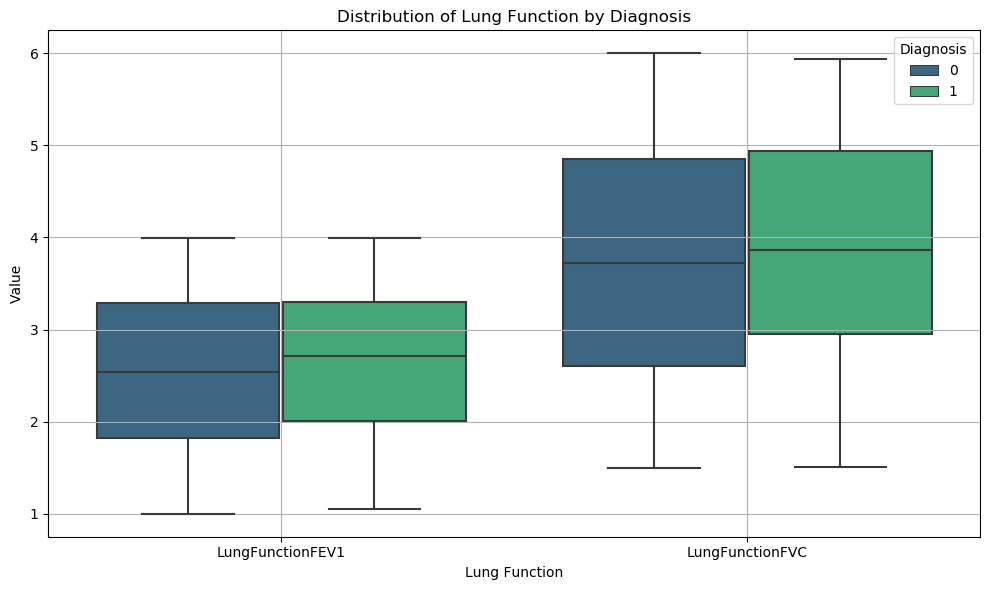

In [50]:
# Melt the dataset to plot both LungFunctionFEV1 and LungFunctionFVC in one plot
melted_data = dataset.melt(id_vars=['Diagnosis'], value_vars=['LungFunctionFEV1', 'LungFunctionFVC'],
                           var_name='LungFunction', value_name='Value')

# Plotting the boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(x='LungFunction', y='Value', hue='Diagnosis', data=melted_data, palette='viridis')

plt.title('Distribution of Lung Function by Diagnosis')
plt.xlabel('Lung Function')
plt.ylabel('Value')
plt.grid(True)
plt.tight_layout()
plt.show()

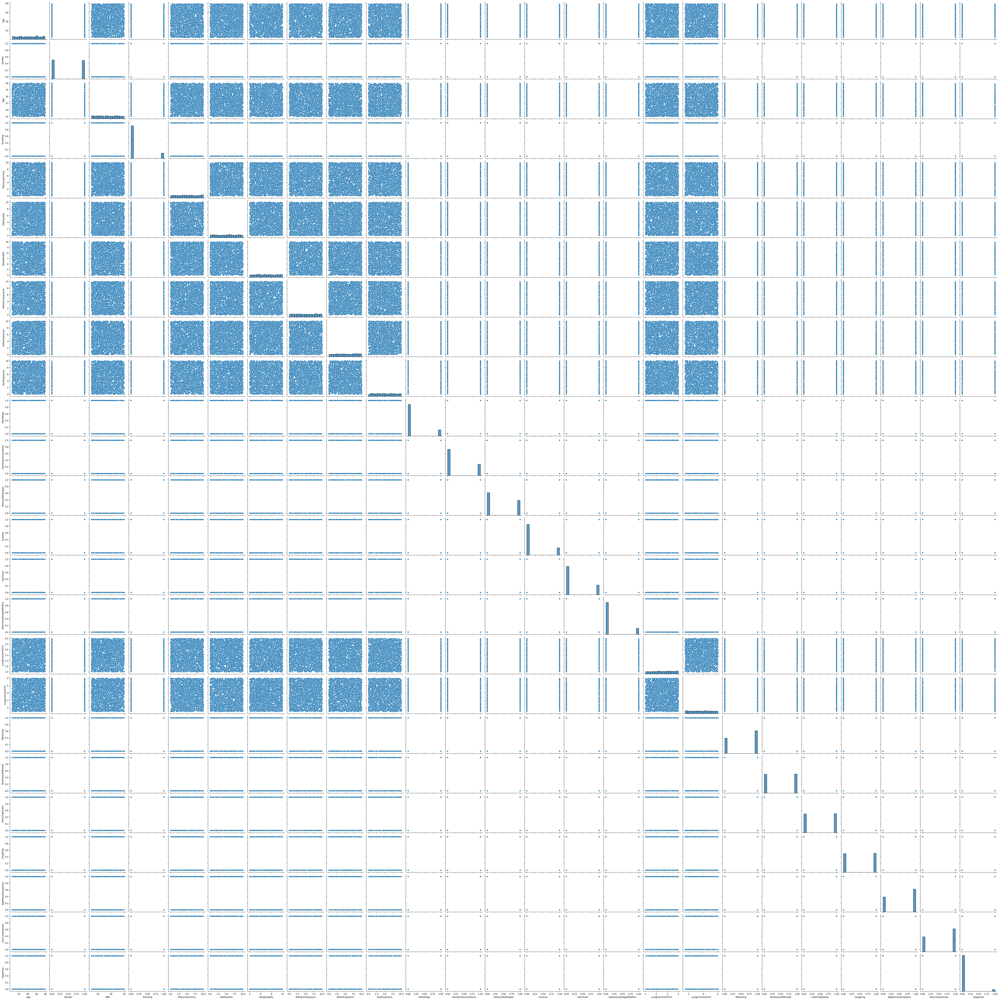

In [51]:
sns.pairplot(dataset)